In [128]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

In [129]:
from pathlib import Path
path = Path('../data_inputs_temp/')

In [130]:
ficheros = ['entropy-shuffle', 'zstd-shuffle-split', 'zlib-shuffle-split', 'lz4hc-shuffle-split']

ficheros_path = [str(path) + '/' + fichero + '.csv.gz' for fichero in ficheros]
dataframes1 = {}
nsplits = [55296] * 4

for i in range(0, len(ficheros)):
    dataframes1[ficheros[i]] = pd.read_csv(ficheros_path[i], delimiter=',')
    codec_filter = np.repeat(ficheros[i], nsplits[i])
    dataframes1[ficheros[i]]['codec_filter'] = codec_filter
    if i == 0:
        categoria = np.repeat(str(30+i), nsplits[i])
    else:
        categoria = np.repeat(str(i-1), nsplits[i])
    dataframes1[ficheros[i]]['categoria'] = categoria
    
    dataframes1[ficheros[i]].rename(columns = {'cratio':'cratio', ' speed':'speed', ' special_vals':'special_vals', ' nchunk':'nchunk', ' category':'category'}, inplace = True)

In [131]:
from pathlib import Path
path = Path('../data_inputs')

In [132]:
ficheros = ['entropy-shuffle', 'zstd-shuffle-split', 'zlib-shuffle-split', 'lz4hc-shuffle-split']

ficheros_path = [str(path) + '/' + fichero + '.csv.gz' for fichero in ficheros]
dataframes2 = {}
nsplits = [55296] * 4

for i in range(0, len(ficheros)):
    dataframes2[ficheros[i]] = pd.read_csv(ficheros_path[i], delimiter=',')
    codec_filter = np.repeat(ficheros[i], nsplits[i])
    dataframes2[ficheros[i]]['codec_filter'] = codec_filter
    if i == 0:
        categoria = np.repeat(str(30+i), nsplits[i])
    else:
        categoria = np.repeat(str(i-1), nsplits[i])
    dataframes2[ficheros[i]]['categoria'] = categoria
    
    dataframes2[ficheros[i]].rename(columns = {'cratio':'cratio', ' speed':'speed', ' special_vals':'special_vals', ' nchunk':'nchunk', ' category':'category'}, inplace = True)

In [133]:
from pathlib import Path
path = Path('../data_inputs_wind/')

In [134]:
ficheros = ['entropy-shuffle', 'zstd-shuffle-split', 'zlib-shuffle-split', 'lz4hc-shuffle-split']

ficheros_path = [str(path) + '/' + fichero + '.csv.gz' for fichero in ficheros]
dataframes3 = {}
nsplits = [55296] * 4

for i in range(0, len(ficheros)):
    dataframes3[ficheros[i]] = pd.read_csv(ficheros_path[i], delimiter=',')
    codec_filter = np.repeat(ficheros[i], nsplits[i])
    dataframes3[ficheros[i]]['codec_filter'] = codec_filter
    if i == 0:
        categoria = np.repeat(str(30+i), nsplits[i])
    else:
        categoria = np.repeat(str(i-1), nsplits[i])
    dataframes3[ficheros[i]]['categoria'] = categoria
    
    dataframes3[ficheros[i]].rename(columns = {'cratio':'cratio', ' speed':'speed', ' special_vals':'special_vals', ' nchunk':'nchunk', ' category':'category'}, inplace = True)

In [135]:
df_fig = pd.DataFrame()
for i in range(0, len(ficheros)):
    df_fig = pd.concat([df_fig, dataframes1[ficheros[i]], 
                        dataframes2[ficheros[i]], dataframes3[ficheros[i]]], axis = 0)

In [136]:
df_fig = df_fig[df_fig['special_vals'] == 0]

In [137]:
fig = px.scatter(df_fig, "cratio", "speed", color = "categoria")
fig.show()

0: zstd

1: zlib

2: lz4hc

30: entropy

# Dataframe filter: SHUFFLE

In [138]:
df_entropy = pd.DataFrame()
df_entropy = pd.concat([df_entropy, dataframes1[ficheros[0]], dataframes2[ficheros[0]], 
                       dataframes3[ficheros[0]]], axis = 0)

df_entropy.rename(columns = {'cratio':'cratio31', 'speed':'speed31', 'special_vals':'special_vals31'}, inplace = True)
df_entropy = df_entropy.drop(['nchunk', 'category', 'codec_filter', 'categoria'], axis = 1)

In [139]:
df_zstd = pd.DataFrame()
df_zstd = pd.concat([df_zstd, dataframes1[ficheros[1]], dataframes2[ficheros[1]], 
                       dataframes3[ficheros[1]]], axis = 0)

df_zstd.rename(columns = {'cratio':'cratio0', 'speed':'speed0', 'special_vals':'special_vals0'}, inplace = True)
df_zstd = df_zstd.drop(['nchunk', 'category', 'codec_filter', 'categoria'], axis = 1)

In [140]:
df_zlib = pd.DataFrame()
df_zlib = pd.concat([df_zlib, dataframes1[ficheros[2]], dataframes2[ficheros[2]], 
                        dataframes3[ficheros[2]]], axis = 0)

df_zlib.rename(columns = {'cratio':'cratio1', 'speed':'speed1', 'special_vals':'special_vals1'}, inplace = True)
df_zlib = df_zlib.drop(['nchunk', 'category', 'codec_filter', 'categoria'], axis = 1)

In [141]:
df_lz4hc = pd.DataFrame()
df_lz4hc = pd.concat([df_lz4hc, dataframes1[ficheros[3]], dataframes2[ficheros[3]], 
                        dataframes3[ficheros[3]]], axis = 0)

df_lz4hc.rename(columns = {'cratio':'cratio2', 'speed':'speed2', 'special_vals':'special_vals2'}, inplace = True)
df_lz4hc = df_lz4hc.drop(['nchunk', 'category', 'codec_filter', 'categoria'], axis = 1)

In [142]:
df_shuffle = pd.DataFrame()
df_shuffle = pd.concat([df_shuffle, df_zstd, df_zlib, df_lz4hc, df_entropy], axis = 1)

Eliminar special_value (que lo sea en alguna de las 4 categorías)

In [143]:
def delete_final(special_vals0, special_vals1, special_vals2, special_vals31):
    if (special_vals0 == 1 or special_vals1 == 1 or special_vals2 == 1 or special_vals31 == 1):
        return 1
    else:
        return 0

In [144]:
df_shuffle["delete_f"] = df_shuffle.apply(lambda x: delete_final(x[2], x[5], x[8], x[11]), axis=1)

In [145]:
df_shuffle = df_shuffle[df_shuffle['delete_f'] == 0]

In [146]:
df_shuffle = df_shuffle.drop(['delete_f'], axis = 1)

In [147]:
df_input_x = df_shuffle.iloc[:, [9, 10]]

Cálculo del SCORE

In [148]:
df_shuffle = df_shuffle.drop(['cratio31', 'speed31', 'special_vals31', 'special_vals0', 'special_vals1', 'special_vals2'], axis = 1)

In [149]:
dfcratios = pd.DataFrame()
for i in range(0, 3):
    dfcratios = pd.concat([dfcratios, df_shuffle.iloc[:, 2*i]], axis =0)

In [150]:
desv_cratio = dfcratios.std()[0]
desv_cratio

208.05926512360497

In [151]:
mean_cratio = dfcratios.mean()[0]
mean_cratio

50.47411044808042

In [152]:
dfspeeds = pd.DataFrame()
for i in range(0, 3):
    dfspeeds = pd.concat([dfspeeds, df_shuffle.iloc[:, 2*i+1]], axis =0)

In [153]:
mean_speed = dfspeeds.mean()[0]
mean_speed

39376518.19056785

In [154]:
desv_speed = dfspeeds.std()[0]
desv_speed

90027647.01752351

In [155]:
theta = 0.96

cratio0 = df_shuffle["cratio0"]
speed0 = df_shuffle["speed0"]
ncratio0 = (cratio0 - mean_cratio) / desv_cratio
nspeed0 = (speed0 - mean_speed) / desv_speed
df_shuffle.insert(2, 0, theta*ncratio0 + (1-theta)*nspeed0)

cratio1 = df_shuffle["cratio1"]
speed1 = df_shuffle["speed1"]
ncratio1 = (cratio1 - mean_cratio) / desv_cratio
nspeed1 = (speed1 - mean_speed) / desv_speed
df_shuffle.insert(5, 1, theta*ncratio1 + (1-theta)*nspeed1)

cratio2 = df_shuffle["cratio2"]
speed2 = df_shuffle["speed2"]
ncratio2 = (cratio2 - mean_cratio) / desv_cratio
nspeed2 = (speed2 - mean_speed) / desv_speed
df_shuffle.insert(8, 2, theta*ncratio2 + (1-theta)*nspeed2)

In [156]:
df_pos = df_shuffle
df_pos = df_pos.drop(['cratio0', 'speed0', 'cratio1', 'speed1', 'cratio2', 'speed2'], axis = 1)

In [157]:
best_categ_shuffle = df_pos.idxmax(axis=1)
best_categ_shuffle = pd.DataFrame(best_categ_shuffle, columns=['best_categ'])

In [158]:
categorias = best_categ_shuffle['best_categ'].unique()

In [159]:
unique, counts = np.unique(best_categ_shuffle, return_counts=True)
result = np.column_stack((unique, counts))
result

array([[    0, 10749],
       [    1, 57558],
       [    2,  9618]])

In [160]:
df_t = pd.DataFrame()
df_t = pd.concat([df_t, df_input_x['cratio31']], axis = 1)
df_t = pd.concat([df_t, df_input_x['speed31']], axis = 1)
df_t = pd.concat([df_t, best_categ_shuffle], axis = 1)

Balancear

In [161]:
df_blc = pd.DataFrame()
for i in categorias:
    df_i = df_t[df_t['best_categ'] == i]
    df_i = df_i.head(n=9618)
    df_blc = pd.concat([df_blc, df_i], axis = 0)

In [162]:
dfinput_y = pd.DataFrame()
dfinput_y = pd.concat([dfinput_y, df_blc['best_categ']], axis = 1)

In [163]:
dfinput_x = df_blc.drop(['best_categ'], axis = 1)

Normalizar inputs

In [164]:
dfcratios = pd.DataFrame()
dfcratios = pd.concat([dfcratios, dfinput_x.iloc[:, 0]], axis =0)

In [165]:
desv_cratio = dfcratios.std()[0]
desv_cratio

53.93514190654935

In [166]:
mean_cratio = dfcratios.mean()[0]
mean_cratio

30.56446315935399

In [167]:
dfspeeds = pd.DataFrame()
dfspeeds = pd.concat([dfspeeds, dfinput_x.iloc[:, 1]], axis =0)

In [168]:
mean_speed = dfspeeds.mean()[0]
mean_speed

7146869134.262147

In [169]:
desv_speed = dfspeeds.std()[0]
desv_speed

6219969011.615214

In [170]:
cratio = dfinput_x["cratio31"]
speed = dfinput_x["speed31"]
ncratio = (cratio - mean_cratio) / desv_cratio
nspeed = (speed - mean_speed) / desv_speed

dfinput_x_norm = pd.DataFrame()
dfinput_x_norm.insert(0, "ncratio", ncratio)
dfinput_x_norm.insert(1, "nspeed", nspeed)

In [171]:
dfinput_x = dfinput_x_norm

In [172]:
dfinput_x.shape

(28854, 2)

In [173]:
dfinput_y.shape

(28854, 1)

# RED NEURONAL (3 categorías)

In [174]:
from sklearn.model_selection import train_test_split

# Split the data
x_train, x_test, y_train, y_test = train_test_split(dfinput_x, dfinput_y, test_size=0.1, shuffle= True)

In [175]:
x_train.shape

(25968, 2)

In [176]:
x_test.shape

(2886, 2)

In [177]:
y_test_nocod = y_test.copy()

In [178]:
from keras.utils import to_categorical
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

In [179]:
from keras import models, layers
import tensorflow

tensorflow.random.set_seed(100)

model = models.Sequential()
model.add(layers.Dense(2, activation='relu', input_shape=(2,)))
model.add(layers.Dense(2, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))

In [180]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])

In [181]:
history = model.fit(x_train, y_train, epochs = 60, validation_data = (x_test, y_test))

Epoch 1/60
812/812 [==============================] - 1s 532us/step - loss: 0.9472 - acc: 0.5811 - val_loss: 0.7980 - val_acc: 0.5627
Epoch 2/60
812/812 [==============================] - 0s 407us/step - loss: 0.7809 - acc: 0.5515 - val_loss: 0.7517 - val_acc: 0.5929
Epoch 3/60
812/812 [==============================] - 0s 466us/step - loss: 0.7404 - acc: 0.6054 - val_loss: 0.7178 - val_acc: 0.6958
Epoch 4/60
812/812 [==============================] - 0s 416us/step - loss: 0.7039 - acc: 0.6974 - val_loss: 0.6891 - val_acc: 0.6764
Epoch 5/60
812/812 [==============================] - 0s 424us/step - loss: 0.6738 - acc: 0.6942 - val_loss: 0.6703 - val_acc: 0.6830
Epoch 6/60
812/812 [==============================] - 0s 409us/step - loss: 0.6543 - acc: 0.6969 - val_loss: 0.6604 - val_acc: 0.6861
Epoch 7/60
812/812 [==============================] - 0s 412us/step - loss: 0.6476 - acc: 0.6974 - val_loss: 0.6555 - val_acc: 0.6875
Epoch 8/60
812/812 [==============================] - 0s 401us

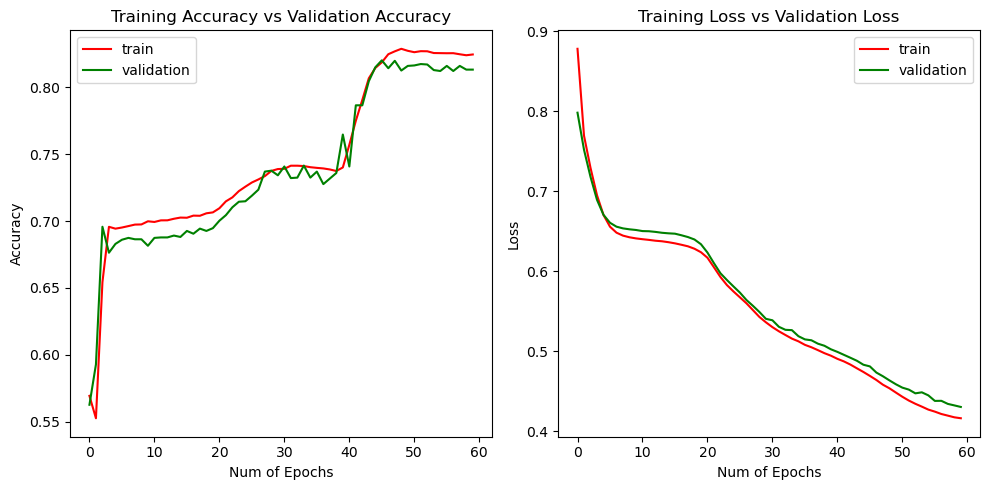

In [182]:
_, ax = plt.subplots(1, 2, figsize=(10, 5), dpi=100)
ax[0].plot(history.history['acc'], 'r')
ax[0].plot(history.history['val_acc'], 'g')
ax[0].set_xlabel("Num of Epochs")
ax[0].set_ylabel("Accuracy")
ax[0].set_title("Training Accuracy vs Validation Accuracy")
ax[0].legend(['train', 'validation'])

ax[1].plot(history.history['loss'], 'r')
ax[1].plot(history.history['val_loss'], 'g')
ax[1].set_xlabel("Num of Epochs")
ax[1].set_ylabel("Loss")
ax[1].set_title("Training Loss vs Validation Loss")
ax[1].legend(['train', 'validation'])

plt.tight_layout()

In [183]:
y_hat = model.predict(x=x_test)

In [184]:
y_pred_label = np.argmax(y_hat, axis = 1)
y_true_label = np.argmax(y_test, axis = 1)

In [185]:
unique, counts = np.unique(y_pred_label, return_counts=True)
result = np.column_stack((unique, counts))
result

array([[   0, 1017],
       [   1,  861],
       [   2, 1008]])

In [186]:
unique, counts = np.unique(y_true_label, return_counts=True)
result = np.column_stack((unique, counts))
result

array([[  0, 984],
       [  1, 963],
       [  2, 939]])

In [187]:
tabla = pd.crosstab(y_pred_label, y_true_label)
tabla

col_0,0,1,2
row_0,,,
0,875,85,57
1,107,672,82
2,2,206,800


# Análisis resultados

In [188]:
df_correctos = pd.DataFrame(columns=['cratio', 'speed', 'category'])

In [189]:
for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    categ_act = y_test_nocod.iloc[i, 0]
    
    df_correctos = df_correctos.append({'cratio': cratio_act, 'speed': speed_act, 'category': categ_act}, ignore_index=True)
    

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/1526488092.py:6: FutureWarning:

The frame.append method is depreca

In [190]:
fig = px.scatter(df_correctos, "cratio", "speed", color = "category")
fig.show()

GRÁFICAS POR CATEGORÍA (Y SU ERROR)

In [191]:
df_0 = pd.DataFrame(columns=['cratio', 'speed', 'category'])

In [192]:
for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    categ_act = y_test_nocod.iloc[i, 0]
    if y_pred_label[i] == y_true_label[i] and y_pred_label[i] == 0.0:
        df_0 = df_0.append({'cratio': cratio_act, 'speed': speed_act, 'category': 0}, ignore_index=True)

for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    if y_pred_label[i] != y_true_label[i] and y_true_label[i] == 0.0:
        df_0 = df_0.append({'cratio': cratio_act, 'speed': speed_act, 'category': -1}, ignore_index=True)

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:12: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/231471944.py:12: FutureWarning:

The frame.append method is depreca

In [193]:
fig = px.scatter(df_0, "cratio", "speed", color = "category")
fig.show()

In [194]:
df_1 = pd.DataFrame(columns=['cratio', 'speed', 'category'])

In [195]:
for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    categ_act = y_test_nocod.iloc[i, 0]
    if y_pred_label[i] == y_true_label[i] and y_pred_label[i] == 1.0:
        df_1 = df_1.append({'cratio': cratio_act, 'speed': speed_act, 'category': 1}, ignore_index=True)

for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    if y_pred_label[i] != y_true_label[i] and y_true_label[i] == 1.0:
        df_1 = df_1.append({'cratio': cratio_act, 'speed': speed_act, 'category': -2}, ignore_index=True)

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is de

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is de

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is de

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is de

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is de

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3336450026.py:12: FutureWarning:

The frame.append method is de

In [196]:
fig = px.scatter(df_1, "cratio", "speed", color = "category")
fig.show()

In [197]:
df_2 = pd.DataFrame(columns=['cratio', 'speed', 'category'])

In [198]:
for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    categ_act = y_test_nocod.iloc[i, 0]
    if y_pred_label[i] == y_true_label[i] and y_pred_label[i] == 2.0:
        df_2 = df_2.append({'cratio': cratio_act, 'speed': speed_act, 'category': 2}, ignore_index=True)

for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    if y_pred_label[i] != y_true_label[i] and y_true_label[i] == 2.0:
        df_2 = df_2.append({'cratio': cratio_act, 'speed': speed_act, 'category': -3}, ignore_index=True)

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is de

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is de

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_30705/3875004451.py:12: FutureWarning:

The frame.append method is de

In [199]:
fig = px.scatter(df_2, "cratio", "speed", color = "category")
fig.show()